In [ ]:
!pip install lime

Connecting to Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import glob
import re
import pickle
import string
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.tokenize import word_tokenize
!pip install keras_preprocessing
import nltk
!pip install plot_keras_history
%matplotlib inline

In [ ]:
dataset = pd.read_csv('/content/drive/MyDrive/English Hate speech/train.csv')

In [ ]:
class_counts = dataset['class'].value_counts()

print("Number of values in each class:")
print(class_counts)

Number of values in each class:
class
1    19190
2     4163
0     1430
Name: count, dtype: int64


In [ ]:
print(f"num of tweets: {dataset.shape}")

# extract the text and labels
tweet = list(dataset['tweet'])
labels = list(dataset['class'])

num of tweets: (24783, 6)


In [ ]:
from sklearn.model_selection import train_test_split
# Split the dataset
d_train, d_test = train_test_split(dataset, test_size=0.2, random_state=42)

In [ ]:
print(d_train.shape)
print(d_test.shape)

(19826, 6)
(4957, 6)


In [ ]:
d_train.head()

,count,hate_speech_count,offensive_language_count,neither_count,class,tweet
15272,3,2,0,1,0,RT @FunSizedYogi: @TheBlackVoice well how else...
9351,3,0,0,3,2,Funny thing is....it's not just the people doi...
20323,3,0,3,0,1,"RT @winkSOSA: ""@AintShitSweet__: ""@Rakwon_OGOD..."
3638,3,0,3,0,1,@Jbrendaro30 @ZGabrail @ramsin1995 @GabeEli8 @...
20579,6,0,6,0,1,S/o that real bitch


**Preprocessing**

In [ ]:
!pip install nltk
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

In [ ]:
stop_words = set(stopwords.words('english'))

stop_words.add("rt")

# remove html entity:
def remove_entity(raw_text):
    entity_regex = r"&[^\s;]+;"
    text = re.sub(entity_regex, "", raw_text)
    return text

# change the user tags
def change_user(raw_text):
    regex = r"@([^ ]+)"
    text = re.sub(regex, " ", raw_text)

    return text

# remove urls
def remove_url(raw_text):
    url_regex = r"(?i)\b((?:https?://|www\d{0,3}[.]|[a-z0-9.\-]+[.][a-z]{2,4}/)(?:[^\s()<>]+|\(([^\s()<>]+|(\([^\s()<>]+\)))*\))+(?:\(([^\s()<>]+|(\([^\s()<>]+\)))*\)|[^\s`!()\[\]{};:'\".,<>?«»“”‘’]))"
    text = re.sub(url_regex, '', raw_text)

    return text

# Remove '@', '#', '/', '?', '$', ')', '(', ':', '-', '_', and numbers
def remove_special_characters(raw_text):
    regex = r"[*@#|/$?()\-_:0-9]"
    text = re.sub(regex, "", raw_text)
    return text

#remove numbers
def remove_numbers(raw_text):
  num_regex = '\d+'
  text = re.sub(num_regex, '', raw_text)
  return text

# remove unnecessary symbols
def remove_noise_symbols(raw_text):
    text = raw_text.replace('"', '')
    text = text.replace("'", '')
    text = text.replace("!", '')
    text = text.replace("`", '')
    text = text.replace("..", '')
    text = text.replace(",", '')
    text = text.replace(".", '')

    return text

# remove stopwords
def remove_stopwords(raw_text):
    tokenize = nltk.word_tokenize(raw_text)
    text = [word for word in tokenize if not word.lower() in stop_words]
    text = " ".join(text)

    return text

## this function in to clean all the dataset by utilizing all the function above
def preprocess(datas):
    clean = []
    # change the @xxx into "user"
    clean = [change_user(text) for text in datas]
    # remove emojis (specifically unicode emojis)
    clean = [remove_entity(text) for text in clean]
    # remove urls
    clean = [remove_url(text) for text in clean]
    # remove trailing stuff
    clean = [remove_noise_symbols(text) for text in clean]
    # remove stopwords
    clean = [remove_stopwords(text) for text in clean]
    # remove special characters
    clean = [remove_special_characters(text) for text in clean]

    return clean

In [ ]:
nltk.download('punkt')

In [ ]:
clean_tweet_train = preprocess(d_train['tweet'])
clean_tweet_test = preprocess(d_test['tweet'])

In [ ]:
d_train['content_cleansing'] = clean_tweet_train
d_test['content_cleansing'] = clean_tweet_test

In [ ]:
d_train.tail()

,count,hate_speech_count,offensive_language_count,neither_count,class,tweet,content_cleansing
21575,3,0,0,3,2,The last at-bat at Yankee Stadium. Thanks for ...,last atbat Yankee Stadium Thanks making good o...
5390,3,0,3,0,1,@_bradleey LMFAOOOO yooo I lost my elevator pa...,LMFAOOOO yooo lost elevator pass cant even sha...
860,3,1,2,0,1,"#porn,#android,#iphone,#ipad,#sex,#xxx, | #Ana...",porn android iphone ipad sex xxx Anal ...
15795,3,0,3,0,1,RT @JennyJohnsonHi5: Just when I thought Justi...,thought Justin Bieber couldnt anymore pussy ge...
23654,3,0,3,0,1,"bitches ain&#8217;t shit, and they ain&#8217;t...",bitches aint shit aint saying nothin


In [ ]:
d_test.head()

,count,hate_speech_count,offensive_language_count,neither_count,class,tweet,content_cleansing
2281,3,0,3,0,1,934 8616\ni got a missed call from yo bitch,got missed call yo bitch
15914,3,0,3,0,1,RT @KINGTUNCHI_: Fucking with a bad bitch you ...,Fucking bad bitch gone need money lil homie
18943,3,0,1,2,2,RT @eanahS__: @1inkkofrosess lol my credit ain...,lol credit aint near good know right man job h...
16407,3,0,3,0,1,RT @Maxin_Betha Wipe the cum out of them faggo...,Wipe cum faggot Contact lens wildin cant see shit
13326,3,1,2,0,1,Niggas cheat on they bitch and don't expect no...,Niggas cheat bitch dont expect pay back WHATSO...


In [ ]:
texts_train = d_train['content_cleansing'].values
texts_test = d_test['content_cleansing'].values
y_train = d_train['class'].values
y_test =  d_test['class'].values

In [ ]:
print(f"num train tweets: {y_train.shape[0]}")
print(f"num test tweets: {y_test.shape[0]}")

num train tweets: 19826
num test tweets: 4957


**Model Building**

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin
from keras.layers import concatenate, Conv1D, GRU
from keras.layers import GlobalAveragePooling1D, GlobalMaxPooling1D
from tensorflow.keras.utils import plot_model, model_to_dot

import tensorflow as tf
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Embedding
from tensorflow.keras.layers import Dense, Dropout
from keras.layers import Input
from keras_preprocessing.sequence import pad_sequences
from keras_preprocessing.text import Tokenizer
from tensorflow.keras.regularizers import l2
from keras.layers import SpatialDropout1D
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score

from keras import backend as K

class KerasTextClassifier(BaseEstimator, TransformerMixin):
    '''Wrapper class for keras text classification models that takes raw text as input.'''

    def __init__(self, max_words=300000, input_length=100, emb_dim=100, n_classes=3, epochs=5, batch_size=32):
        self.max_words = max_words
        self.input_length = input_length
        self.emb_dim = emb_dim
        self.n_classes = n_classes
        self.epochs = epochs
        self.bs = batch_size
        self.classes_ = None
        self.model = self._get_model()
        self.tokenizer = Tokenizer(num_words=self.max_words+1,
                                   lower=True, split=' ', oov_token="UNK")

    def _get_model(self):
        input_text = Input((self.input_length,))

        # Embedding layer
        text_embedding = Embedding(input_dim=self.max_words + 2, output_dim=self.emb_dim,
                                    input_length=self.input_length, mask_zero=False)(input_text)
        text_embedding = SpatialDropout1D(0.5)(text_embedding)

        # Convolutional layers
        conv_1 = Conv1D(filters=128, kernel_size=5, padding='same', activation='relu')(text_embedding)
        conv_2 = Conv1D(filters=64, kernel_size=3, padding='same', activation='relu')(conv_1)
        max_pool = GlobalMaxPooling1D()(conv_2)

        # BiLSTM layer
        bilstm = Bidirectional(LSTM(units=64, return_sequences=True, recurrent_dropout=0.5))(text_embedding)
        bilstm_flatten = Flatten()(bilstm)  # Flatten the BiLSTM output

        # Concatenate features
        x = concatenate([max_pool, bilstm_flatten])

        # Dense layers
        x = Dense(256, activation="relu")(x)
        x = Dropout(0.5)(x)
        x = Dense(128, activation="relu")(x)
        x = Dropout(0.3)(x)

        # Output layer
        out = Dense(units=self.n_classes, activation="softmax")(x)

        model = Model(input_text, out)
        model.compile(optimizer="adam",
                      loss="sparse_categorical_crossentropy",
                      metrics=["accuracy"])
        plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)
        return model


    def _get_sequences(self, texts):
        seqs = self.tokenizer.texts_to_sequences(texts)
        return pad_sequences(seqs, maxlen=self.input_length, value=0)

    def _preprocess(self, texts):
        return [re.sub(r"\d", "DIGIT", x) for x in texts]


    def fit(self, X, y):
        '''
        Fit the vocabulary and the model.

        :params:
        X: list of texts.
        y: labels.
        '''

        self.tokenizer.fit_on_texts(self._preprocess(X))
        self.tokenizer.word_index = {e: i for e, i in self.tokenizer.word_index.items() if i <= self.max_words}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.max_words + 1
        seqs = self._get_sequences(self._preprocess(X))

        # Initialize the label encoder
        self._init_label_encoder(y)
        y = self._encode_label(y)

        # Fit the model and store the history object
        history = self.model.fit(seqs, y, batch_size=self.bs, epochs=self.epochs, validation_split=0.1)
        return history

    def predict_proba(self, X, y=None):
        seqs = self._get_sequences(self._preprocess(X))
        return self.model.predict(seqs)

    def predict(self, X, y=None):
        return np.argmax(self.predict_proba(X), axis=1)

    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)

    def trasnform(self, X):
        return self._get_sequences(self._preprocess(X))

    def _encode_label(self, y):
        return self.label_encoder.transform(y)

    def _decode_label(self, y):
        return self.label_encoder.inverse_transform(y)

    def _init_label_encoder(self, y):
        self.label_encoder = LabelEncoder()
        self.label_encoder.fit(y)
        self.classes_ = self.label_encoder.classes_

    def _encode_feature(self, x):
        self.tokenizer.fit_on_texts(self._preprocess(x))
        self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.word_cnt}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.word_cnt + 1
        return self._get_sequences(self._preprocess(x))

    def predict_decode(self, X, y=None):
        return self._decode_label(self.predict(X))

    def summary(self):
       return self.model.summary()
text_model = KerasTextClassifier(epochs=10, max_words=300000, input_length=200)

In [ ]:
text_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 200)]                0         []                            
                                                                                                  
 embedding_1 (Embedding)     (None, 200, 100)             3000020   ['input_2[0][0]']             
                                                          0                                       
                                                                                                  
 spatial_dropout1d_1 (Spati  (None, 200, 100)             0         ['embedding_1[0][0]']         
 alDropout1D)                                                                                     
                                                                                            

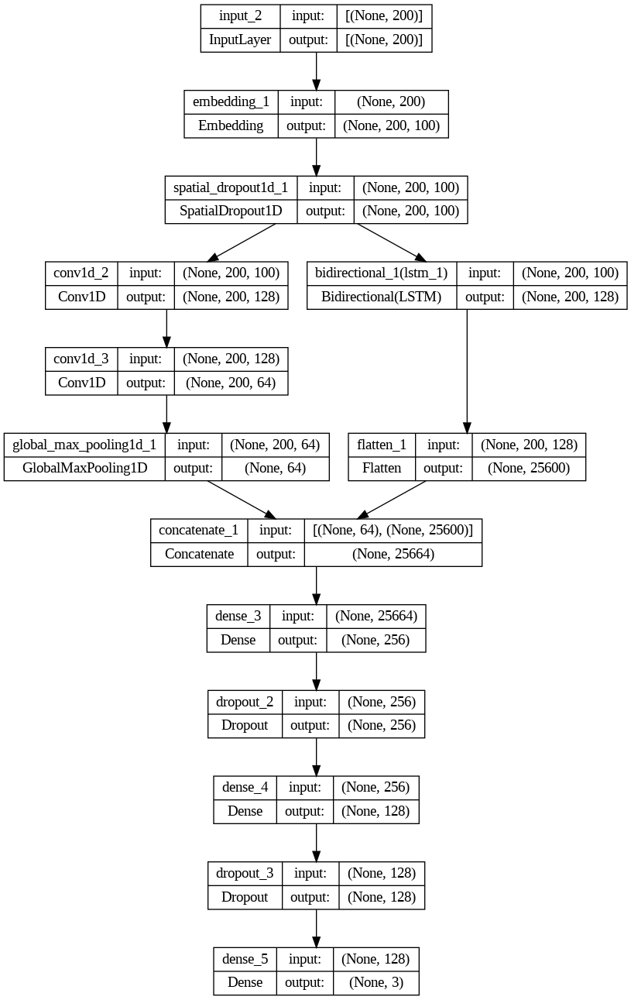

In [ ]:
from IPython.display import Image
Image(filename='model_plot.png')

In [ ]:
from plot_keras_history import show_history, plot_history
import matplotlib.pyplot as plt
history = text_model.fit(texts_train, y_train)
show_history(history)
plot_history(history, path="/content/drive/MyDrive/English Hate speech", single_graphs=True)
plt.close()

In [ ]:
y_pred = text_model.predict(texts_test)

In [ ]:
text_model.score(texts_test, y_test)

**LIME**

In [ ]:
import seaborn as sns
%matplotlib inline
from collections import OrderedDict
from lime.lime_text import LimeTextExplainer
from lime import lime_text
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import FeatureUnion

In [ ]:
#0 : Hate speech
#1 : Offensive Language
#2 : Neither

import seaborn as sns
%matplotlib inline
from collections import OrderedDict
from lime.lime_text import LimeTextExplainer

import seaborn as sns
sns.despine()

<Figure size 640x480 with 0 Axes>

**Class 2**

*example 1*

Sample 1100: last 80 words (only part used by the model)
--------------------------------------------------
Diabetes galore Colorado health officials recommend pot brownie ban
--------------------------------------------------
1/1 [==============================] - 0s 463ms/step
Probability(positive) = 7.512044e-05
True class:  2
157/157 [==============================] - 19s 122ms/step


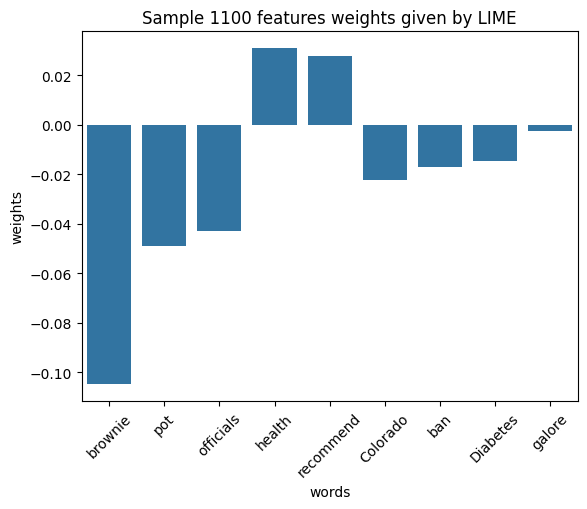

In [ ]:
idx =1100
text_sample = texts_test[idx]

class_names = ['0', '1', '2']

print('Sample {}: last 80 words (only part used by the model)'.format(idx))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})

sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx));

In [ ]:
idx =1100
exp = explainer.explain_instance(texts_test[idx], text_model.predict_proba, num_features=6, top_labels=10)
print(exp.available_labels())

157/157 [==============================] - 23s 150ms/step
[2, 1, 0]


In [ ]:
exp.show_in_notebook(text=texts_test[idx], labels=(2,))

*example 2*

Sample 3977: last 80 words (only part used by the model)
--------------------------------------------------
open starburst candy get yellows lmao bruh
--------------------------------------------------
1/1 [==============================] - 0s 122ms/step
Probability(positive) = 0.19455889
True class:  2
157/157 [==============================] - 28s 177ms/step


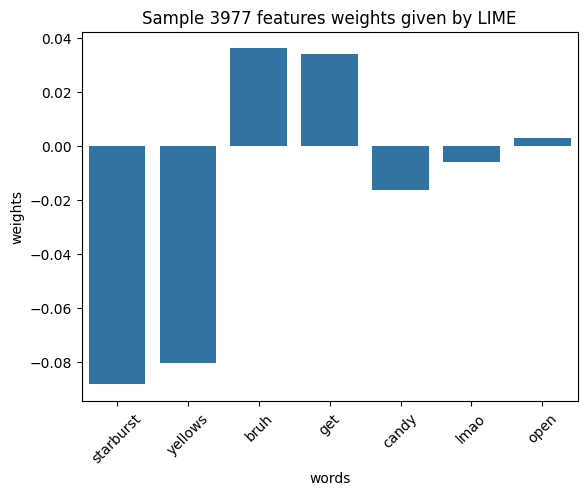

In [ ]:
idx =3977
text_sample = texts_test[idx]

class_names = ['0', '1', '2']

print('Sample {}: last 80 words (only part used by the model)'.format(idx))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})

sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx));

In [ ]:
idx =3977
exp = explainer.explain_instance(texts_test[idx], text_model.predict_proba, num_features=6, top_labels=10)
print(exp.available_labels())

157/157 [==============================] - 21s 130ms/step
[2, 1, 0]


In [ ]:
exp.show_in_notebook(text=texts_test[idx], labels=(2,))

**Class 1**

*example 1*

Sample 498: last 80 words (only part used by the model)
--------------------------------------------------
punk bitches take salmon cream cheese
--------------------------------------------------
1/1 [==============================] - 0s 199ms/step
Probability(positive) = 0.9842019
True class:  1
157/157 [==============================] - 20s 125ms/step


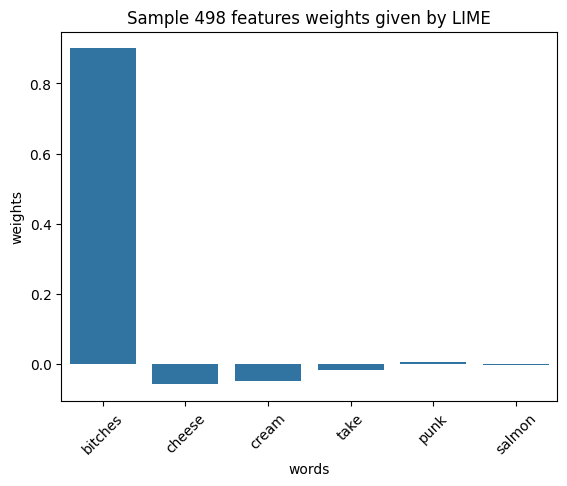

In [ ]:
idx =498
text_sample = texts_test[idx]

class_names = ['0', '1', '2']

print('Sample {}: last 80 words (only part used by the model)'.format(idx))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})

sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx));

In [ ]:
idx =498
exp = explainer.explain_instance(texts_test[idx], text_model.predict_proba, num_features=6, top_labels=10)
print(exp.available_labels())

157/157 [==============================] - 20s 129ms/step
[1, 0, 2]


In [ ]:
exp.show_in_notebook(text=texts_test[idx], labels=(1,))

*example 2*

Sample 4955: last 80 words (only part used by the model)
--------------------------------------------------
Fat Trel niggah
--------------------------------------------------
1/1 [==============================] - 0s 388ms/step
Probability(positive) = 0.8688717
True class:  1
157/157 [==============================] - 23s 145ms/step


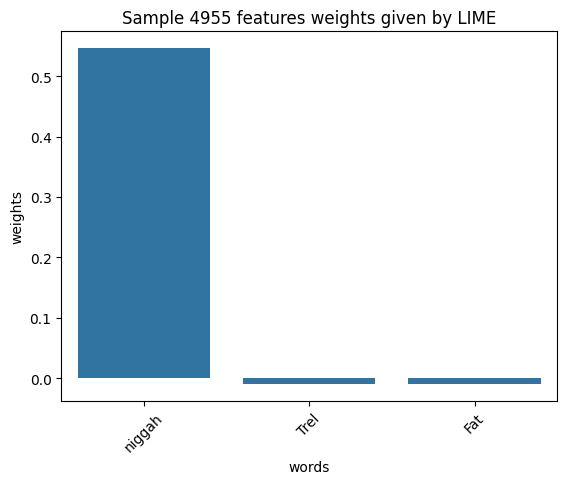

In [ ]:
idx =4955
text_sample = texts_test[idx]

class_names = ['0', '1', '2']

print('Sample {}: last 80 words (only part used by the model)'.format(idx))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})

sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx));

In [ ]:
idx =4955
exp = explainer.explain_instance(texts_test[idx], text_model.predict_proba, num_features=6, top_labels=10)
print(exp.available_labels())

157/157 [==============================] - 22s 141ms/step
[1, 0, 2]


In [ ]:
exp.show_in_notebook(text=texts_test[idx], labels=(1,))

**Class 0**

*example 1*

Sample 114: last 80 words (only part used by the model)
--------------------------------------------------
well Genos ultimate faggot
--------------------------------------------------
1/1 [==============================] - 0s 117ms/step
Probability(positive) = 0.17215692
True class:  0
157/157 [==============================] - 21s 134ms/step


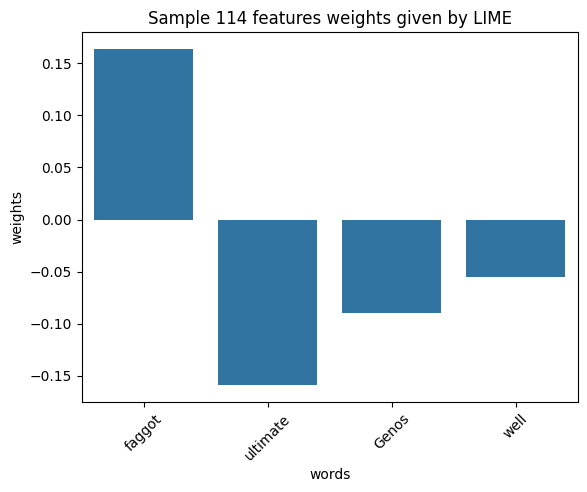

In [ ]:
idx =114
text_sample = texts_test[idx]

class_names = ['0', '1', '2']

print('Sample {}: last 80 words (only part used by the model)'.format(idx))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})

sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx));

In [ ]:
idx =114
exp = explainer.explain_instance(texts_test[idx], text_model.predict_proba, num_features=6, top_labels=10)
print(exp.available_labels())

157/157 [==============================] - 19s 123ms/step
[0, 1, 2]


In [ ]:
exp.show_in_notebook(text=texts_test[idx], labels=(0,))

*example 2*

Sample 2313: last 80 words (only part used by the model)
--------------------------------------------------
hes retarded gay mix
--------------------------------------------------
1/1 [==============================] - 0s 197ms/step
Probability(positive) = 0.33474165
True class:  1
157/157 [==============================] - 19s 122ms/step


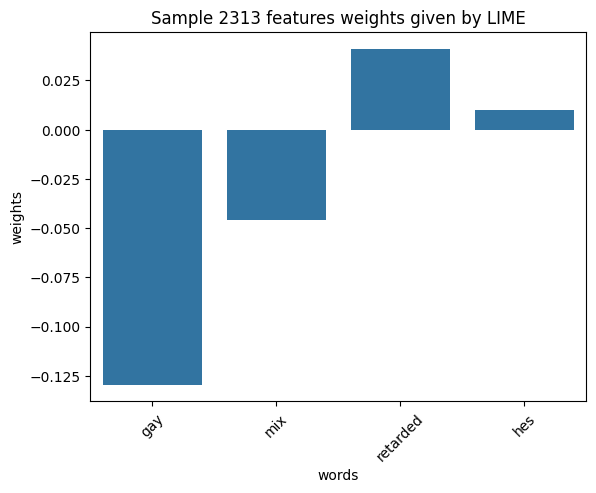

In [ ]:
idx = 2313
text_sample = texts_test[idx]

class_names = ['0', '1', '2']

print('Sample {}: last 80 words (only part used by the model)'.format(idx))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})

sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx));

In [ ]:
idx =2313
exp = explainer.explain_instance(texts_test[idx], text_model.predict_proba, num_features=6, top_labels=10)
print(exp.available_labels())

157/157 [==============================] - 25s 156ms/step
[0, 1, 2]


In [ ]:
exp.show_in_notebook(text=texts_test[idx], labels=(0,))